In [33]:
import os
os.environ["CRDS_PATH"] = os.path.expanduser("~/crds_cache")
os.makedirs(os.environ["CRDS_PATH"], exist_ok=True)

os.environ["CRDS_SERVER_URL"] = "https://jwst-crds.stsci.edu"
os.environ["CRDS_CONTEXT"] = "jwst_1460.pmap"
from astropy.table import Table
import numpy as np
import matplotlib.pyplot as plt
import astropy.units as u
from astroquery.svo_fps import SvoFps
from astropy.wcs import WCS
from astropy.io import fits
from extinction import apply
from astropy.modeling import models
import extinction
from dust_extinction.averages import RL85_MWGC

def get_mag(catalog, ww, filtername='f140m'):
    print(ww.proj_plane_pixel_area())
    flux= (catalog['flux_fit_' + filtername] * u.MJy/u.sr * ww.proj_plane_pixel_area()).to(u.Jy)
    eflux_jy = (catalog['flux_err_' + filtername] * u.MJy/u.sr *  ww.proj_plane_pixel_area()).to(u.Jy)

    jfilts = SvoFps.get_filter_list('JWST')
    jfilts.add_index('filterID')
    zeropoint = u.Quantity(jfilts.loc[f'JWST/NIRCam.{filtername.upper()}']['ZeroPoint'], u.Jy)
    abmag = -2.5 * np.log10(flux / zeropoint) * u.mag
    abmag_err = 2.5 / np.log(10) * np.abs(eflux_jy / flux) * u.mag

    return abmag, abmag_err

def plot_extvec_ccd(ax, color1, color2, ext=RL85_MWGC(), extvec_scale=200,
                    start=(0, 0),
                    color='y', head_width=0.5):
    def get_wave(c):
        if c == '410m405': return 4.10*u.um
        if c == '405m410': return 4.05*u.um
        if c == 'Hmag': return 1.634*u.um
        if c == 'Ksmag': return 2.143527*u.um
        return int(c[1:-1])/100*u.um

    w1 = get_wave(color1[0])
    w2 = get_wave(color1[1])
    w3 = get_wave(color2[0])
    w4 = get_wave(color2[1])

    if w1 > w2:
        w1, w2 = w2, w1
        color1 = color1[::-1]
    if w3 > w4:
        w3, w4 = w4, w3
        color2 = color2[::-1]
    print(w1,w2,w3,w4)

    # Only plot if all are in valid range
    try:
        e_1 = ext(1/w1) * extvec_scale
        e_2 = ext(1/w2) * extvec_scale
        e_3 = ext(1/w3) * extvec_scale
        e_4 = ext(1/w4) * extvec_scale
    except ValueError as e:
        print(f"Extinction vector not plotted: {e}")
        return
    print(w1,w2,w3,w4)
    print(e_1, e_2, e_3, e_4)
    ax.annotate(f'$A_V={extvec_scale}$', xy=(start[0] + (e_1 - e_2), start[1] + (e_3 - e_4)),
                xytext=(start[0], start[1]),
                arrowprops=dict(arrowstyle='-|>', color=color,
                                shrinkA=0, shrinkB=0,
                                mutation_scale=20, linewidth=1.5))
    ax.plot([], [], color=color, marker='>', markersize=8,
            label=f'$A_V={extvec_scale}$', linestyle='-', linewidth=2)

from astropy.table import Table
import crds
parsec_av0 = Table.read('/home/t.yoo/parsec_av0.txt', format='ascii')
parsec_av0.pprint(max_width=-1, max_lines=-1)    
m_init = parsec_av0['col4']  
parsec_av0 = parsec_av0[m_init<300]                    
logage_av0 = parsec_av0['col3']
mass_av0 = parsec_av0['col6']
F140Mmag_av0 = parsec_av0['col39'] + 5*np.log10(5400)-5
F162Mmag_av0 = parsec_av0['col40']+ 5*np.log10(5400)-5
F182Mmag_av0 = parsec_av0['col41']+ 5*np.log10(5400)-5
F210Mmag_av0 = parsec_av0['col42']+ 5*np.log10(5400)-5
F335Mmag_av0 = parsec_av0['col45']+ 5*np.log10(5400)-5
F360Mmag_av0 = parsec_av0['col46']+ 5*np.log10(5400)-5
F410Mmag_av0 = parsec_av0['col47']+ 5*np.log10(5400)-5
F480Mmag_av0 = parsec_av0['col50']+ 5*np.log10(5400)-5

parsec_av5 = Table.read('/home/t.yoo/parsec_av5.txt', format='ascii')
logage_av5 = parsec_av5['col3']
mass_av5 = parsec_av5['col6']
F140Mmag_av5 = parsec_av5['col39']+ 5*np.log10(5400)-5
F162Mmag_av5 = parsec_av5['col40'] + 5*np.log10(5400)-5
F182Mmag_av5 = parsec_av5['col41']+ 5*np.log10(5400)-5
F210Mmag_av5 = parsec_av5['col42']+ 5*np.log10(5400)-5
F335Mmag_av5 = parsec_av5['col45']+ 5*np.log10(5400)-5
F360Mmag_av5 = parsec_av5['col46']+ 5*np.log10(5400)-5
F410Mmag_av5 = parsec_av5['col47']+ 5*np.log10(5400)-5
F480Mmag_av5 = parsec_av5['col50']+ 5*np.log10(5400)-5

parsec_av10 = Table.read('/home/t.yoo/parsec_av10.txt', format='ascii')
logage_av10 = parsec_av10['col3']
mass_av10 = parsec_av10['col6']
F140Mmag_av10 = parsec_av10['col39']+ 5*np.log10(5400)-5
F162Mmag_av10 = parsec_av10['col40']+ 5*np.log10(5400)-5
F182Mmag_av10 = parsec_av10['col41']+ 5*np.log10(5400)-5
F210Mmag_av10 = parsec_av10['col42']+ 5*np.log10(5400)-5
F335Mmag_av10 = parsec_av10['col45']+ 5*np.log10(5400)-5
F360Mmag_av10 = parsec_av10['col46']+ 5*np.log10(5400)-5
F410Mmag_av10 = parsec_av10['col47']+ 5*np.log10(5400)-5
F480Mmag_av10 = parsec_av10['col50']+ 5*np.log10(5400)-5


import asdf

def load_nircam_abvega_offsets(asdf_path, filter_name):
    """
    Load JWST NIRCam AB–Vega offset reference file (ASDF) 
    and return a dict mapping filter names → offsets (in mag).
    
    The ASDF file is expected to follow the JWST CRDS “FILTEROFFSET”
    (or an equivalent zeropoint offset) schema.
    """
    with asdf.open(asdf_path) as af:
        tree = af.tree
        # The offsets might live under some key, e.g. tree["offsets"] or tree["filters"]
        # Inspect the file structure to adapt:
        # For example, tree["data"] or tree["offsets"] or tree["filters"]
        # Here’s a guess:
        tabs = tree.get("abvega_offset", None)
        idx = np.where((tabs['filter'] == filter_name.upper()) & (tabs['pupil']=='CLEAR'))[0]
        if len(idx)!=1:
            idx = np.where(tabs['pupil']==filter_name.upper())[0]
        tabs.pprint(max_width=-1, max_lines=-1)
        print(idx)
        return tabs['abvega_offset'][idx].item()


def vega_to_ab(vega_mag, filter_name, asdf_path):
    """
    Convert Vega magnitude to AB magnitude using offset dictionary.
    """
    offset = load_nircam_abvega_offsets(asdf_path, filter_name)
   
    return vega_mag + offset

"""
from astropy.io import fits
hdr = fits.getheader(image_filenames['f140m'], ext=('SCI', 1))
print(hdr)
crds_params = {
    "INSTRUME": "NIRCAM",
    "DETECTOR": 'NRCA1',  # or NRCB5, etc.
    "META.OBSERVATION.DATE": hdr['DATE-OBS']  # Use the actual observation date
}

# Path or URL to your .rmap file
ref_file = crds.getreferences(crds_params, ["abvegaoffset"], context="jwst_1460.pmap")

rmap = crds.rmap.load_mapping(ref_file["nircam_abvegaoffset"]
)
references = rmap.get_data()
"""
#asdf_file = crds.get_reference_file("jwst", refname)
asdf_file = '/home/t.yoo/w51/w51_nircam/jwst_nircam_abvegaoffset_0002.asdf'
F140M_avmag_av0 = vega_to_ab(F140Mmag_av0, 'F140M', asdf_file)
F162M_avmag_av0 = vega_to_ab(F162Mmag_av0, 'F162M', asdf_file)
F182M_avmag_av0 = vega_to_ab(F182Mmag_av0, 'F182M', asdf_file)
F210M_avmag_av0 = vega_to_ab(F210Mmag_av0, 'F210M', asdf_file)
F335M_avmag_av0 = vega_to_ab(F335Mmag_av0, 'F335M', asdf_file)
F360M_avmag_av0 = vega_to_ab(F360Mmag_av0, 'F360M', asdf_file)
F410M_avmag_av0 = vega_to_ab(F410Mmag_av0, 'F410M', asdf_file)
F480M_avmag_av0 = vega_to_ab(F480Mmag_av0, 'F480M', asdf_file)

F140M_avmag_av5 = vega_to_ab(F140Mmag_av5, 'F140M', asdf_file)
F162M_avmag_av5 = vega_to_ab(F162Mmag_av5, 'F162M', asdf_file)
F182M_avmag_av5 = vega_to_ab(F182Mmag_av5, 'F182M', asdf_file)
F210M_avmag_av5 = vega_to_ab(F210Mmag_av5, 'F210M', asdf_file)
F335M_avmag_av5 = vega_to_ab(F335Mmag_av5, 'F335M', asdf_file)
F360M_avmag_av5 = vega_to_ab(F360Mmag_av5, 'F360M', asdf_file)
F410M_avmag_av5 = vega_to_ab(F410Mmag_av5, 'F410M', asdf_file)
F480M_avmag_av5 = vega_to_ab(F480Mmag_av5, 'F480M', asdf_file)

F140M_avmag_av10 = vega_to_ab(F140Mmag_av10, 'F140M', asdf_file)
F162M_avmag_av10 = vega_to_ab(F162Mmag_av10, 'F162M', asdf_file)
F182M_avmag_av10 = vega_to_ab(F182Mmag_av10, 'F182M', asdf_file)
F210M_avmag_av10 = vega_to_ab(F210Mmag_av10, 'F210M', asdf_file)
F335M_avmag_av10 = vega_to_ab(F335Mmag_av10, 'F335M', asdf_file)
F360M_avmag_av10 = vega_to_ab(F360Mmag_av10, 'F360M', asdf_file)
F410M_avmag_av10 = vega_to_ab(F410Mmag_av10, 'F410M', asdf_file)
F480M_avmag_av10 = vega_to_ab(F480Mmag_av10, 'F480M', asdf_file)


    


catalog = Table.read('/orange/adamginsburg/w51/TaehwaYoo/jwst_w51/catalogs/final_nircam_indivexp_merged_dao_refined.fits')

image_filenames ={
    "f140m": "/orange/adamginsburg/jwst/w51/F140M/pipeline/jw06151-o001_t001_nircam_clear-f140m-merged_i2d.fits",
    "f150w": "/orange/adamginsburg/jwst/w51/F150W/pipeline/jw06151-o001_t001_nircam_clear-f150w-merged_i2d.fits",
    "f162m": "/orange/adamginsburg/jwst/w51/F162M/pipeline/jw06151-o001_t001_nircam_clear-f162m-merged_i2d.fits",
    "f182m": "/orange/adamginsburg/jwst/w51/F182M/pipeline/jw06151-o001_t001_nircam_clear-f182m-merged_i2d.fits",
    "f187n": "/orange/adamginsburg/jwst/w51/F187N/pipeline/jw06151-o001_t001_nircam_clear-f187n-merged_i2d.fits",
    "f210m": "/orange/adamginsburg/jwst/w51/F210M/pipeline/jw06151-o001_t001_nircam_clear-f210m-merged_i2d.fits",
    "f335m": "/orange/adamginsburg/jwst/w51/F335M/pipeline/jw06151-o001_t001_nircam_clear-f335m-merged_i2d.fits",
    "f360m": "/orange/adamginsburg/jwst/w51/F360M/pipeline/jw06151-o001_t001_nircam_clear-f360m-merged_i2d.fits",
    "f405n": "/orange/adamginsburg/jwst/w51/F405N/pipeline/jw06151-o001_t001_nircam_clear-f405n-merged_i2d.fits",
    "f410m": "/orange/adamginsburg/jwst/w51/F410M/pipeline/jw06151-o001_t001_nircam_clear-f410m-merged_i2d.fits", # weird, the filename is different from what is downloaded with the STScI pipeline...
    "f480m": "/orange/adamginsburg/jwst/w51/F480M/pipeline/jw06151-o001_t001_nircam_clear-f480m-merged_i2d.fits",
    "f560w": "/orange/adamginsburg/jwst/w51/F560W/pipeline/jw06151-o002_t001_miri_f560w_i2d.fits",
    "f770w": "/orange/adamginsburg/jwst/w51/F770W/pipeline/jw06151-o002_t001_miri_f770w_i2d.fits",
    "f1000w": "/orange/adamginsburg/jwst/w51/F1000W/pipeline/jw06151-o002_t001_miri_f1000w_i2d.fits",
    "f1280w": "/orange/adamginsburg/jwst/w51/F1280W/pipeline/jw06151-o002_t001_miri_f1280w_i2d.fits",
    "f1500w": "/orange/adamginsburg/jwst/w51/F1500W/pipeline/jw06151-o002_t001_miri_f1500w_i2d.fits",
    "f2100w": "/orange/adamginsburg/jwst/w51/F2100W/pipeline/jw06151-o002_t001_miri_f2100w_i2d.fits",
    
}

f140m_header = fits.getheader(image_filenames['f140m'], ext=('SCI', 1))
f162m_header = fits.getheader(image_filenames['f162m'], ext=('SCI', 1))
f182m_header = fits.getheader(image_filenames['f182m'], ext=('SCI', 1))
f210m_header = fits.getheader(image_filenames['f210m'], ext=('SCI', 1))
f335m_header = fits.getheader(image_filenames['f335m'], ext=('SCI', 1))
f360m_header = fits.getheader(image_filenames['f360m'], ext=('SCI', 1))
f405n_header = fits.getheader(image_filenames['f405n'], ext=('SCI', 1))
f410m_header = fits.getheader(image_filenames['f410m'], ext=('SCI', 1))
f480m_header = fits.getheader(image_filenames['f480m'], ext=('SCI', 1))

f140m_mag, f140m_magerr = get_mag(catalog, WCS(f140m_header), filtername='f140m')
f162m_mag, f162m_magerr = get_mag(catalog, WCS(f162m_header), filtername='f162m')
f182m_mag, f182m_magerr = get_mag(catalog, WCS(f182m_header), filtername='f182m')
f210m_mag, f210m_magerr = get_mag(catalog, WCS(f210m_header), filtername='f210m')
f335m_mag, f335m_magerr = get_mag(catalog, WCS(f335m_header), filtername='f335m')
f360m_mag, f360m_magerr = get_mag(catalog, WCS(f360m_header), filtername='f360m')
f405n_mag, f405n_magerr = get_mag(catalog, WCS(f405n_header), filtername='f405n')
f410m_mag, f410m_magerr = get_mag(catalog, WCS(f410m_header), filtername='f410m')
f480m_mag, f480m_magerr = get_mag(catalog, WCS(f480m_header), filtername='f480m')




 col1    col2    col3       col4          col5       col6   col7   col8   col9 col10 col11 col12  col13 col14 col15 col16 col17 col18   col19   col20  col21   col22    col23     col24     col25   col26   col27   col28  col29  col30  col31  col32  col33  col34  col35  col36  col37  col38  col39  col40  col41  col42  col43  col44  col45  col46  col47  col48  col49  col50 
------ ------- ------- -------------- ------------ ------- ------ ------ ----- ----- ----- ------ ----- ----- ----- ----- ----- ----- --------- ----- -------- ------ --------- --------- --------- ------ ------- ------- ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------ ------
0.0207 0.15867     6.0   0.0908484459 1.0897678296   0.091  -1.33 3.4326 3.409     0   0.0  0.545   0.0   0.0   0.0   0.0   0.0    -1 -3.89e-14   0.0   0.6936 0.2855  0.003749  0.001011  0.009172   -1.0 0.02085   8.095  9.712  7.478  6.249  5.749  5.324 

Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
2025-10-13 14:59:25,433 - stpipe - WARNING - FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2025-05-06T16:37:42.537' from MJD-BEG.
Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'.
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
2025-10-13 14:59:25,436 - stpipe - WARNING - FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to  -106.570116 from OBSGEO-[XYZ].
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'.
Set DATE-AVG to '2025-05-06T14:19:06.870' from MJD-AVG.
Set DATE-END to '2025-05-06T14:41:02.194' from MJD-END'. [astropy.wcs.wcs]
2025-10-13 14:59:25,469 - stpipe - WARNING - FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2025-05-06T13:57:33.0

7.525093728112705e-11 deg2
7.527908837786718e-11 deg2
7.525104772361525e-11 deg2
7.52514718037244e-11 deg2
3.053877779107583e-10 deg2
3.0536898714608487e-10 deg2
3.056563930691893e-10 deg2


Set DATE-AVG to '2025-05-06T16:06:02.828' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'. [astropy.wcs.wcs]
2025-10-13 14:59:25,648 - stpipe - WARNING - FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2025-05-06T15:43:50.732' from MJD-BEG.
Set DATE-AVG to '2025-05-06T16:06:02.828' from MJD-AVG.
Set DATE-END to '2025-05-06T16:29:39.435' from MJD-END'.
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
2025-10-13 14:59:25,651 - stpipe - WARNING - FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to  -106.596047 from OBSGEO-[XYZ].
Set OBSGEO-B to   -25.254571 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611129611.449 from OBSGEO-[XYZ]'.
Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
2025-10-13 14:59:25,677 - stpipe - WARNING - FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2025-05-06T16:37:42.5

3.0541063885182936e-10 deg2
3.054668262896466e-10 deg2


In [34]:

def plot_SED(ax1, catalog, filters=['F140M', 'F162M', 'F182M', 'F210M', 'F300M', 'F335M', 'F360M', 'F410M', 'F480M'],
color=None, alpha=0.7, A_V=15, ext=None, Tdust=5000*u.K):
    """
    Plot the SED of a source from the catalog.

    Parameters:
    catalog : astropy Table
        The catalog containing the source data.
    filters : list of str
        List of filter names to plot.

    Returns:
    None
    """
    import matplotlib.pyplot as plt

    # Extract fluxes and wavelengths
    fluxes = [catalog[f'flux_fit_{f.lower()}'] for f in filters]
    wavelengths = np.array([float(f[1:-1]) for f in filters])/100  # Assuming filter names are like 'F140M'

    # Plotting
    if color is not None:
        ax1.plot(wavelengths, fluxes, marker='o', alpha=alpha, color=color)
    else:
        ax1.plot(wavelengths, fluxes, marker='o', alpha=alpha)

    if ext is not None:
        bb = models.BlackBody(temperature=Tdust)
        BB_SED = bb(wavelengths * u.um).to(u.Jy/u.sr, equivalencies=u.spectral_density(wavelengths * u.um))
        #if A_V is not None:
            # Convert wavelengths to Angstroms for the extinction function
        wavelengths_angstrom = (wavelengths * u.um).to(u.AA).value
        # Use the Fitzpatrick (1999) extinction curve
        R_V = 3.1
        BB_SED_extincted = apply(extinction.fitzpatrick99(wavelengths_angstrom, A_V, R_V), BB_SED.value)
        normalization_factor =  fluxes[0]/BB_SED_extincted[0]
        ax1.plot(wavelengths, BB_SED_extincted * normalization_factor, linestyle='--', color='r', label=f'Blackbody with A_V = {A_V}')
        ax1.plot(wavelengths, BB_SED * normalization_factor, linestyle = '--', color = 'k', label = f'Blackbody, {round(Tdust.value)} K, no extinction')
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlabel('Wavelength (microns)')
    ax1.set_ylabel('Flux (Jy)')


f140m_img = fits.getdata(image_filenames['f140m'], ext=('SCI', 1))
f140m_wcs = WCS(fits.getheader(image_filenames['f140m'], ext=('SCI', 1)))
f480m_img = fits.getdata(image_filenames['f480m'], ext=('SCI', 1))
f480m_wcs = WCS(fits.getheader(image_filenames['f480m'], ext=('SCI', 1)))

Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
2025-10-13 14:59:25,731 - stpipe - WARNING - FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2025-05-06T16:37:42.537' from MJD-BEG.
Set DATE-AVG to '2025-05-06T16:59:22.406' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'.
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
2025-10-13 14:59:25,734 - stpipe - WARNING - FITSFixedWarning: 'obsfix' made the change 'Set OBSGEO-L to  -106.570116 from OBSGEO-[XYZ].
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'.
Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
2025-10-13 14:59:25,752 - stpipe - WARNING - FITSFixedWarning: 'datfix' made the change 'Set DATE-BEG to '2025-05-06T16:37:42.5

/home/t.yoo/anaconda3/envs/py311/lib/python3.11/site-packages/numpy/_core/shape_base.py:64: UserWarning: Warning: converting a masked element to nan.
  result = asanyarray(arys[0])


0
ho
218
0
102


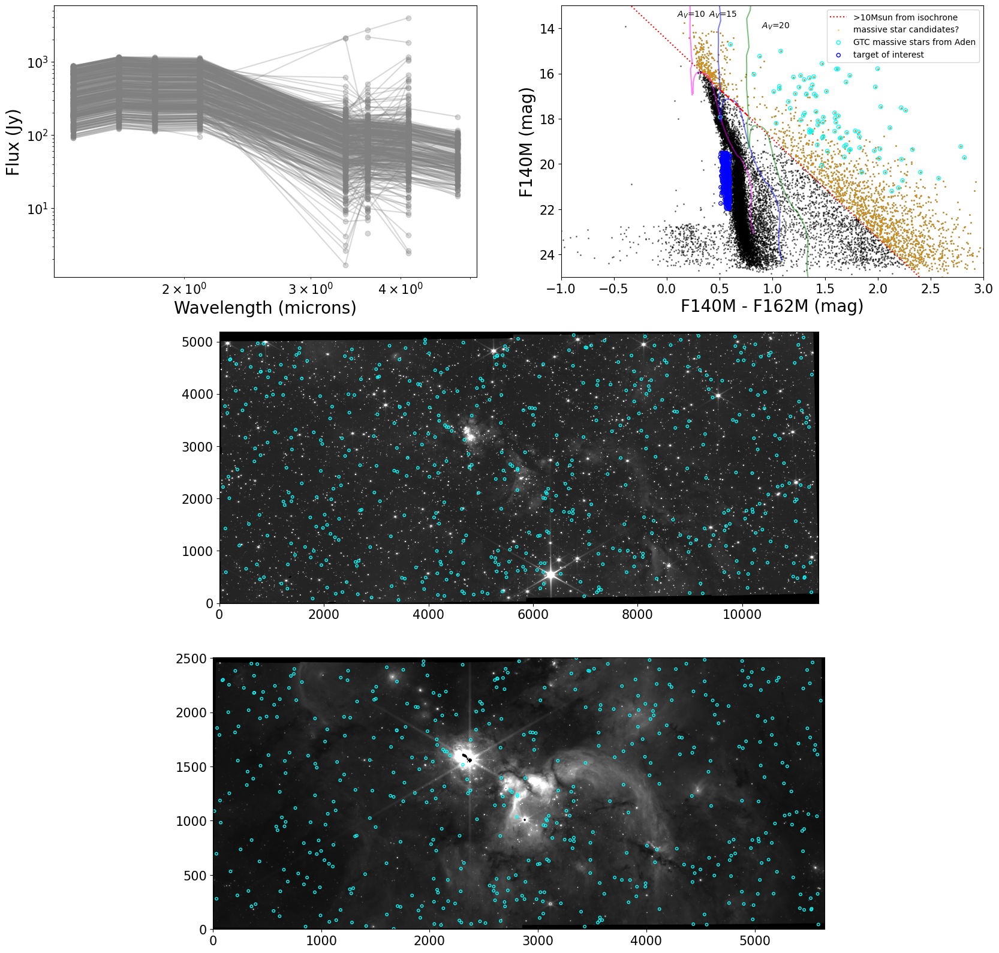

In [35]:
import matplotlib.gridspec as gridspec
from astropy.visualization import simple_norm

from dust_extinction.averages import RL85_MWGC
from dust_extinction.parameter_averages import CCM89
ext = RL85_MWGC()

x = (f140m_mag-f162m_mag).value
y = f140m_mag.value
from astropy.coordinates import SkyCoord

tab_gtc_matched = Table.read('/orange/adamginsburg/w51/TaehwaYoo/massive_star_table_jwstmatched.fits')
tab_gtc_matched_skycoord = SkyCoord(ra=tab_gtc_matched['jwst_matched_ra']*u.deg, dec=tab_gtc_matched['jwst_matched_dec']*u.deg, frame='icrs')
# For catalog
ra = catalog['skycoord'].ra
dec = catalog['skycoord'].dec
valid = (~np.isnan(ra)) & (~np.isnan(dec))
print(len(np.where(valid==False)[0]))
catalog_skycoord_valid = SkyCoord(ra=ra[valid], dec=dec[valid], frame='icrs')
# For GTC matched table
ra_gtc = tab_gtc_matched['jwst_matched_ra']
dec_gtc = tab_gtc_matched['jwst_matched_dec']
print('ho')
print(len(ra_gtc))
valid_gtc = (~np.isnan(ra_gtc)) & (~np.isnan(dec_gtc))
print(len(np.where(valid_gtc==False)[0]))
tab_gtc_matched_skycoord_valid = SkyCoord(ra=ra_gtc[valid_gtc]*u.deg, dec=dec_gtc[valid_gtc]*u.deg, frame='icrs')
print(len(tab_gtc_matched_skycoord_valid))
# Now match only valid entries
idx, d2d, d3d = catalog_skycoord_valid.match_to_catalog_sky(tab_gtc_matched_skycoord_valid)
real_matched = d2d < 0.05*u.arcsec
reverse_idx, reverse_d2d, reverse_d3d = tab_gtc_matched_skycoord_valid.match_to_catalog_sky(catalog_skycoord_valid)
real_reverse_matched = reverse_d2d < 0.05*u.arcsec


spatial_idx1 = np.where((x>0.5) & (x<0.6) & (y>19.5) & (y<22))[0]

fig = plt.figure(figsize=(20,20))
gs = gridspec.GridSpec(3, 2, figure=fig)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 = fig.add_subplot(gs[1,:])
ax4 = fig.add_subplot(gs[2,:]) 
for row in catalog[spatial_idx1]:
    plot_SED(ax1, row, filters=['F140M', 'F162M', 'F182M', 'F210M', 'F335M', 'F360M', 'F410M', 'F480M'], color='gray', alpha=0.3)

hb = ax2.scatter(x, y, s=1, color='k', alpha=0.5)
#cb = fig.colorbar(hb, ax=ax1, label='log(N)')
ax2.set_xlabel('F140M - F162M (mag)')
ax2.set_ylabel('F140M (mag)')
ageset=[6.0]
for i, age in enumerate(ageset):
    idx_age = logage_av0 == age

    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*15) , color='blue', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*20) , color='green', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*10), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*10) , color='magenta', alpha=0.5)
    idx_10msun = np.argmin(np.abs(mass_av0[idx_age]-10))
    x_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15
    y_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*15
    x_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20
    y_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*20
    ax2.plot([x_av15_10msun, x_av20_10msun], [y_av15_10msun, y_av20_10msun], color='r', linestyle='dashed')
    slope = (y_av20_10msun - y_av15_10msun)/(x_av20_10msun - x_av15_10msun)
    y_intercept = y_av15_10msun - slope*x_av15_10msun
    ax2.plot([-1,3], [slope*-1 + y_intercept, slope*3 + y_intercept], color='r', linestyle='dotted',label='>10Msun from isochrone')

# plot scatter with differnet color for the point above the line
ax2.scatter(x[y < (slope*x + y_intercept)], y[y < (slope*x + y_intercept)], s=1, color='orange', alpha=0.5, label='massive star candidates?')

ax2.scatter(x[reverse_idx[real_reverse_matched]], y[reverse_idx[real_reverse_matched]], s=20, facecolor='none', edgecolor='cyan', label='GTC massive stars from Aden')
ax2.scatter(x[spatial_idx1], y[spatial_idx1], s=20, facecolor='none', edgecolor='blue', label='target of interest')
ax2.text(0.1,13.5, r'$A_V$=10')
ax2.text(0.4,13.5, r'$A_V$=15')
ax2.text(0.9,14, r'$A_V$=20')

ax2.set_xlim(-1,3)
ax2.set_ylim(25, 13)
ax2.legend()

ax3.imshow(f140m_img, origin='lower', cmap='gray', norm=simple_norm(f140m_img, 'sqrt', percent=99.5))
pixelcoord = f140m_wcs.world_to_pixel(catalog['skycoord'])
ax3.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')
ax4.imshow(f480m_img, origin='lower', cmap='gray', norm=simple_norm(f480m_img, 'sqrt', percent=99.5))
pixelcoord = f480m_wcs.world_to_pixel(catalog['skycoord'])
ax4.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')

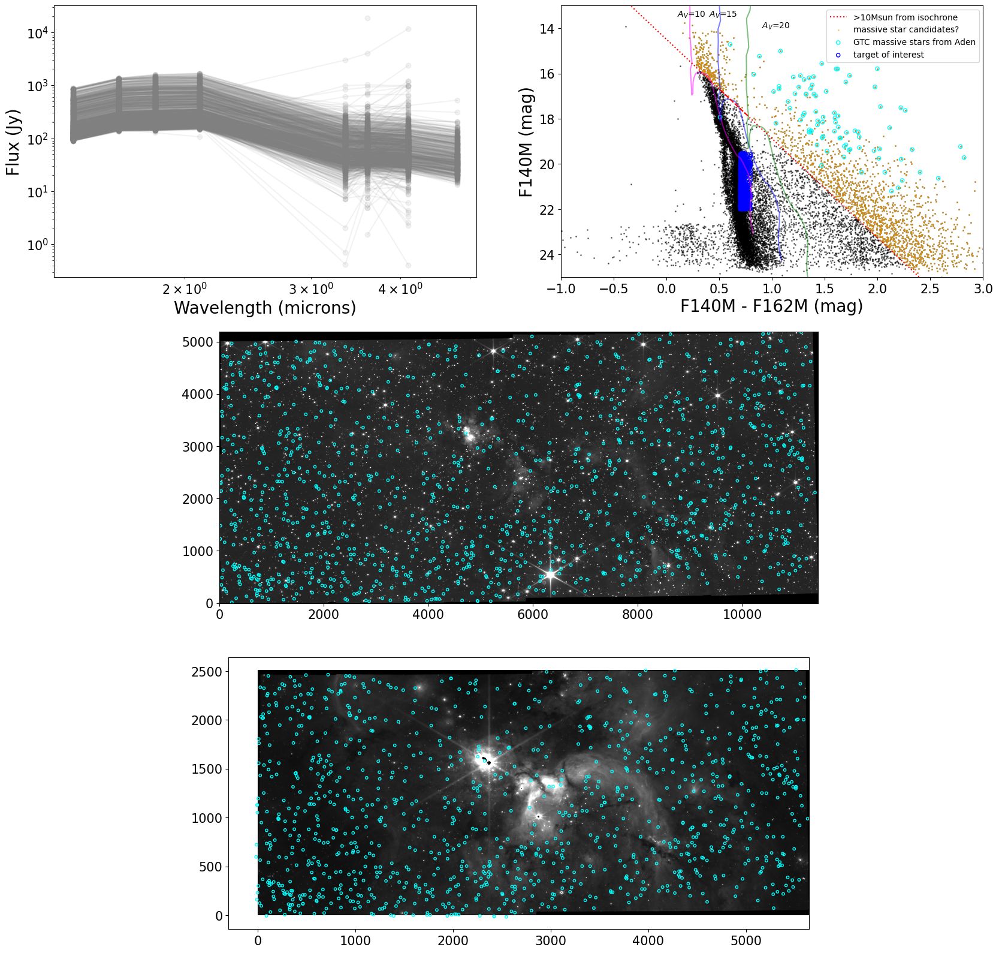

In [36]:
x = (f140m_mag-f162m_mag).value
y = f140m_mag.value
spatial_idx1 = np.where((x>0.7) & (x<0.8) & (y>19.5) & (y<22))[0]

fig = plt.figure(figsize=(20,20))
gs = gridspec.GridSpec(3, 2, figure=fig)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 = fig.add_subplot(gs[1,:])
ax4 = fig.add_subplot(gs[2,:]) 

for row in catalog[spatial_idx1]:
    plot_SED(ax1,row, filters=['F140M', 'F162M', 'F182M', 'F210M', 'F335M', 'F360M', 'F410M', 'F480M'], color='gray', alpha=0.1)
hb = ax2.scatter(x, y, s=1, color='k', alpha=0.5)
#cb = fig.colorbar(hb, ax=ax1, label='log(N)')
ax2.set_xlabel('F140M - F162M (mag)')
ax2.set_ylabel('F140M (mag)')
for i, age in enumerate(ageset):
    idx_age = logage_av0 == age

    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*15) , color='blue', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*20) , color='green', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*10), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*10) , color='magenta', alpha=0.5)
    idx_10msun = np.argmin(np.abs(mass_av0[idx_age]-10))
    x_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15
    y_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*15
    x_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20
    y_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*20
    ax2.plot([x_av15_10msun, x_av20_10msun], [y_av15_10msun, y_av20_10msun], color='r', linestyle='dashed')
    slope = (y_av20_10msun - y_av15_10msun)/(x_av20_10msun - x_av15_10msun)
    y_intercept = y_av15_10msun - slope*x_av15_10msun
    ax2.plot([-1,3], [slope*-1 + y_intercept, slope*3 + y_intercept], color='r', linestyle='dotted',label='>10Msun from isochrone')

# plot scatter with differnet color for the point above the line
ax2.scatter(x[y < (slope*x + y_intercept)], y[y < (slope*x + y_intercept)], s=1, color='orange', alpha=0.5, label='massive star candidates?')

ax2.scatter(x[reverse_idx[real_reverse_matched]], y[reverse_idx[real_reverse_matched]], s=20, facecolor='none', edgecolor='cyan', label='GTC massive stars from Aden')
ax2.scatter(x[spatial_idx1], y[spatial_idx1], s=20, facecolor='none', edgecolor='blue', label='target of interest')
ax2.text(0.1,13.5, r'$A_V$=10')
ax2.text(0.4,13.5, r'$A_V$=15')
ax2.text(0.9,14, r'$A_V$=20')

ax2.set_xlim(-1,3)
ax2.set_ylim(25, 13)
ax2.legend()



ax3.imshow(f140m_img, origin='lower', cmap='gray', norm=simple_norm(f140m_img, 'sqrt', percent=99.5))
pixelcoord = f140m_wcs.world_to_pixel(catalog['skycoord'])
ax3.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')
ax4.imshow(f480m_img, origin='lower', cmap='gray', norm=simple_norm(f480m_img, 'sqrt', percent=99.5))
pixelcoord = f480m_wcs.world_to_pixel(catalog['skycoord'])
ax4.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')

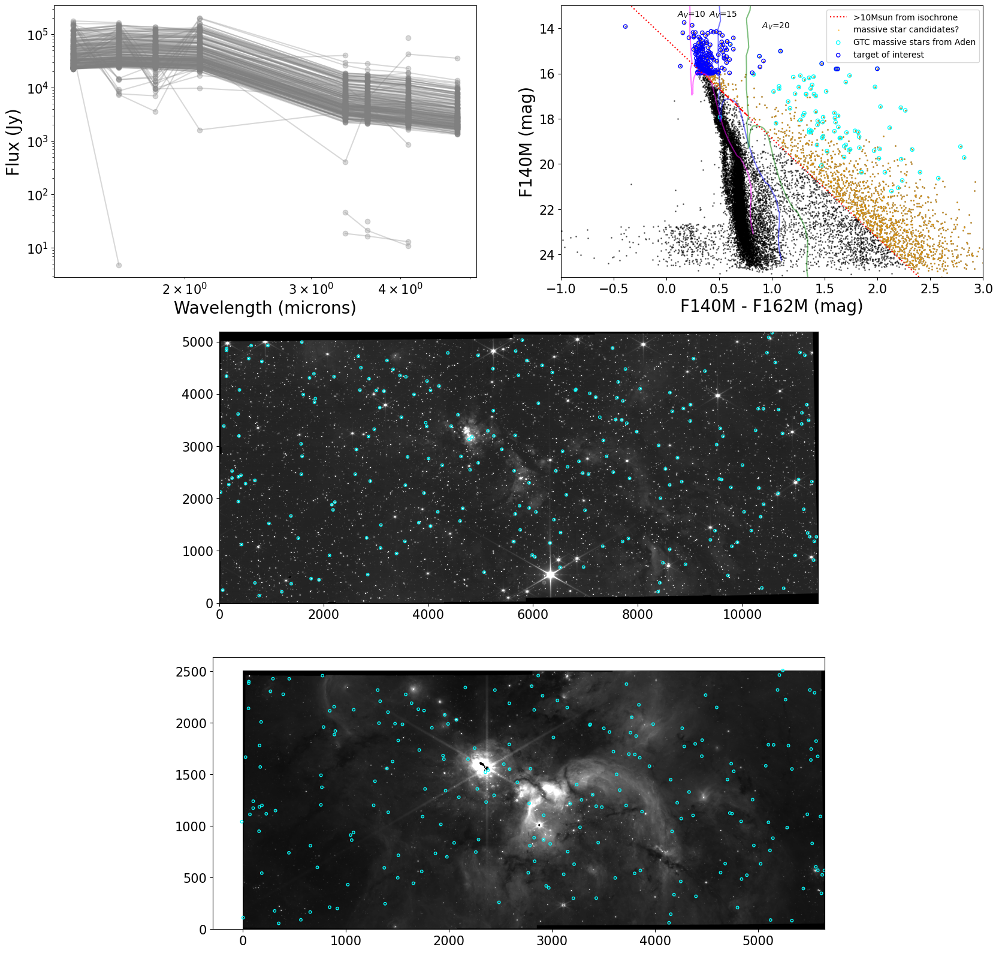

In [37]:
x = (f140m_mag-f162m_mag).value
y = f140m_mag.value
spatial_idx1 = np.where((y<16))[0]

fig = plt.figure(figsize=(20,20))
gs = gridspec.GridSpec(3, 2, figure=fig)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 = fig.add_subplot(gs[1,:])
ax4 = fig.add_subplot(gs[2,:]) 
for row in catalog[spatial_idx1]:
    plot_SED(ax1,row, filters=['F140M', 'F162M', 'F182M', 'F210M', 'F335M', 'F360M', 'F410M', 'F480M'], color='gray', alpha=0.3)
hb = ax2.scatter(x, y, s=1, color='k', alpha=0.5)
#cb = fig.colorbar(hb, ax=ax1, label='log(N)')
ax2.set_xlabel('F140M - F162M (mag)')
ax2.set_ylabel('F140M (mag)')
for i, age in enumerate(ageset):
    idx_age = logage_av0 == age

    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*15) , color='blue', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*20) , color='green', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*10), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*10) , color='magenta', alpha=0.5)
    idx_10msun = np.argmin(np.abs(mass_av0[idx_age]-10))
    x_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15
    y_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*15
    x_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20
    y_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*20
    ax2.plot([x_av15_10msun, x_av20_10msun], [y_av15_10msun, y_av20_10msun], color='r', linestyle='dashed')
    slope = (y_av20_10msun - y_av15_10msun)/(x_av20_10msun - x_av15_10msun)
    y_intercept = y_av15_10msun - slope*x_av15_10msun
    ax2.plot([-1,3], [slope*-1 + y_intercept, slope*3 + y_intercept], color='r', linestyle='dotted',label='>10Msun from isochrone')

# plot scatter with differnet color for the point above the line
ax2.scatter(x[y < (slope*x + y_intercept)], y[y < (slope*x + y_intercept)], s=1, color='orange', alpha=0.5, label='massive star candidates?')

ax2.scatter(x[reverse_idx[real_reverse_matched]], y[reverse_idx[real_reverse_matched]], s=20, facecolor='none', edgecolor='cyan', label='GTC massive stars from Aden')
ax2.scatter(x[spatial_idx1], y[spatial_idx1], s=20, facecolor='none', edgecolor='blue', label='target of interest')
ax2.text(0.1,13.5, r'$A_V$=10')
ax2.text(0.4,13.5, r'$A_V$=15')
ax2.text(0.9,14, r'$A_V$=20')

ax2.set_xlim(-1,3)
ax2.set_ylim(25, 13)
ax2.legend()


ax3.imshow(f140m_img, origin='lower', cmap='gray', norm=simple_norm(f140m_img, 'sqrt', percent=99.5))
pixelcoord = f140m_wcs.world_to_pixel(catalog['skycoord'])
ax3.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')
ax4.imshow(f480m_img, origin='lower', cmap='gray', norm=simple_norm(f480m_img, 'sqrt', percent=99.5))
pixelcoord = f480m_wcs.world_to_pixel(catalog['skycoord'])
ax4.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')

522


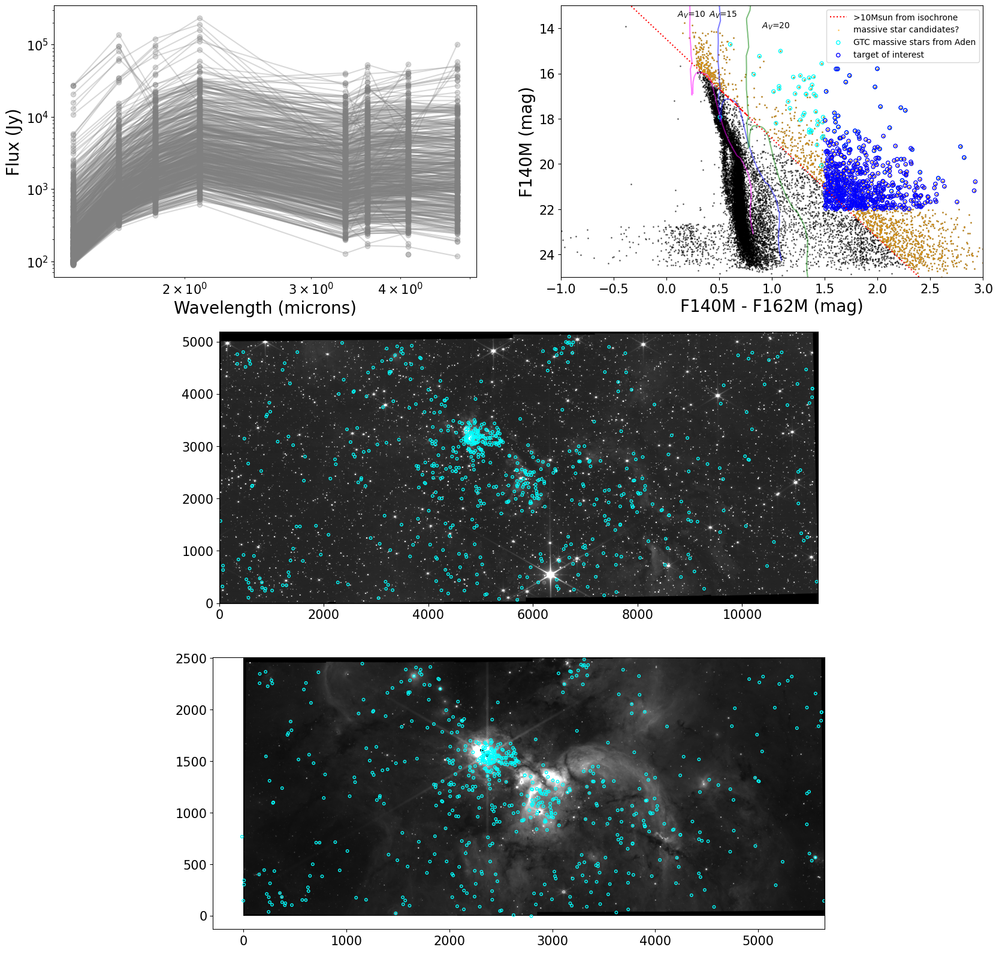

In [38]:
spatial_idx1 = np.where((x>1.5)&(x<3)&(y<22))[0]
fig = plt.figure(figsize=(20,20))
gs = gridspec.GridSpec(3, 2, figure=fig)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 = fig.add_subplot(gs[1,:])
ax4 = fig.add_subplot(gs[2,:]) 
for row in catalog[spatial_idx1]:
    plot_SED(ax1,row, filters=['F140M', 'F162M', 'F182M', 'F210M', 'F335M', 'F360M', 'F410M', 'F480M'], color='gray', alpha=0.3)

hb = ax2.scatter(x, y, s=1, color='k', alpha=0.5)
#cb = fig.colorbar(hb, ax=ax1, label='log(N)')
ax2.set_xlabel('F140M - F162M (mag)')
ax2.set_ylabel('F140M (mag)')
for i, age in enumerate(ageset):
    idx_age = logage_av0 == age

    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*15) , color='blue', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*20) , color='green', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*10), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*10) , color='magenta', alpha=0.5)
    idx_10msun = np.argmin(np.abs(mass_av0[idx_age]-10))
    x_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15
    y_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*15
    x_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20
    y_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*20
    ax2.plot([x_av15_10msun, x_av20_10msun], [y_av15_10msun, y_av20_10msun], color='r', linestyle='dashed')
    slope = (y_av20_10msun - y_av15_10msun)/(x_av20_10msun - x_av15_10msun)
    y_intercept = y_av15_10msun - slope*x_av15_10msun
    ax2.plot([-1,3], [slope*-1 + y_intercept, slope*3 + y_intercept], color='r', linestyle='dotted',label='>10Msun from isochrone')

# plot scatter with differnet color for the point above the line
ax2.scatter(x[y < (slope*x + y_intercept)], y[y < (slope*x + y_intercept)], s=1, color='orange', alpha=0.5, label='massive star candidates?')

ax2.scatter(x[reverse_idx[real_reverse_matched]], y[reverse_idx[real_reverse_matched]], s=20, facecolor='none', edgecolor='cyan', label='GTC massive stars from Aden')
ax2.scatter(x[spatial_idx1], y[spatial_idx1], s=20, facecolor='none', edgecolor='blue', label='target of interest')
print(len(np.where(y < (slope*x + y_intercept-2))[0]))
ax2.text(0.1,13.5, r'$A_V$=10')
ax2.text(0.4,13.5, r'$A_V$=15')
ax2.text(0.9,14, r'$A_V$=20')

ax2.set_xlim(-1,3)
ax2.set_ylim(25, 13)
ax2.legend()
ax3.imshow(f140m_img, origin='lower', cmap='gray', norm=simple_norm(f140m_img, 'sqrt', percent=99.5))
pixelcoord = f140m_wcs.world_to_pixel(catalog['skycoord'])
ax3.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')
ax4.imshow(f480m_img, origin='lower', cmap='gray', norm=simple_norm(f480m_img, 'sqrt', percent=99.5))
pixelcoord = f480m_wcs.world_to_pixel(catalog['skycoord'])
ax4.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')

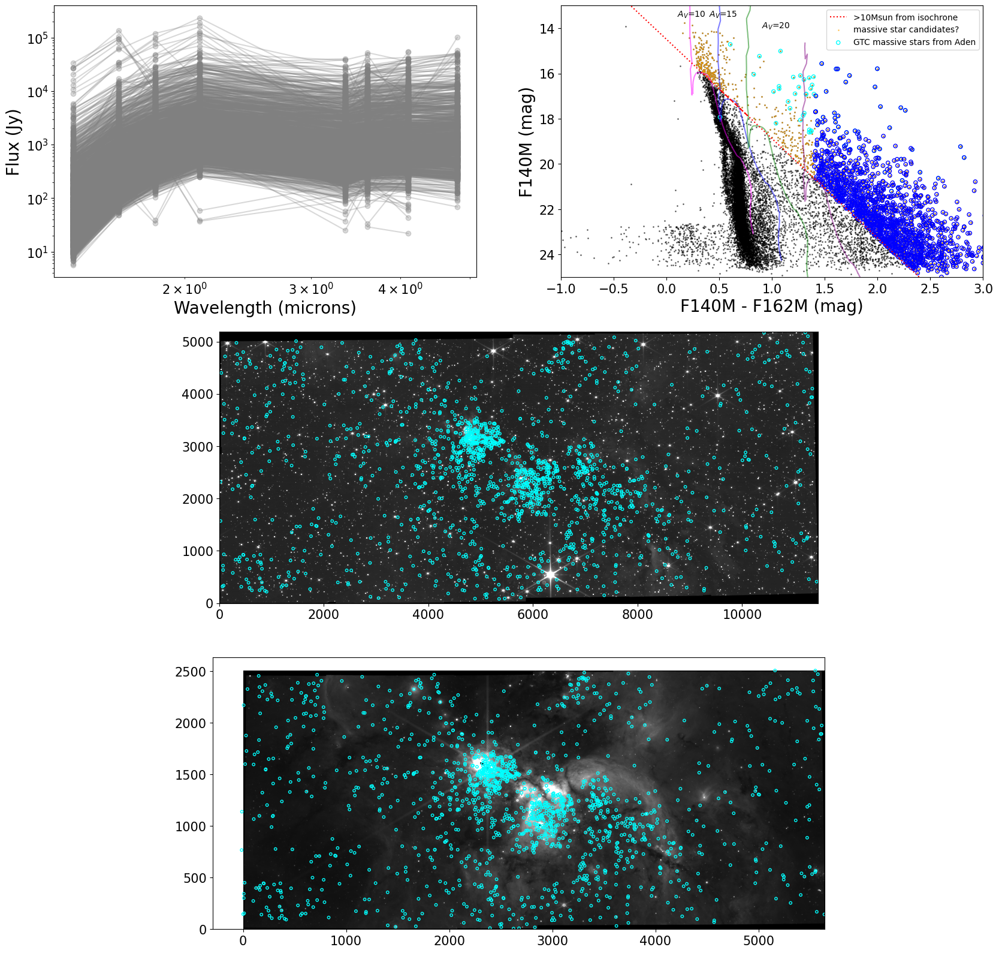

In [39]:
fig = plt.figure(figsize=(20,20))
gs = gridspec.GridSpec(3, 2, figure=fig)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 = fig.add_subplot(gs[1,:])
ax4 = fig.add_subplot(gs[2,:]) 


hb = ax2.scatter(x, y, s=1, color='k', alpha=0.5)
#cb = fig.colorbar(hb, ax=ax1, label='log(N)')
ax2.set_xlabel('F140M - F162M (mag)')
ax2.set_ylabel('F140M (mag)')
for i, age in enumerate(ageset):
    idx_age = logage_av0 == age

    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*15) , color='blue', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*20) , color='green', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*10), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*10) , color='magenta', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*30), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*30) , color='purple', alpha=0.5)
    idx_10msun = np.argmin(np.abs(mass_av0[idx_age]-10))
    x_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15
    y_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*15
    x_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20
    y_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*20
    ax2.plot([x_av15_10msun, x_av20_10msun], [y_av15_10msun, y_av20_10msun], color='r', linestyle='dashed')
    slope = (y_av20_10msun - y_av15_10msun)/(x_av20_10msun - x_av15_10msun)
    y_intercept = y_av15_10msun - slope*x_av15_10msun
    ax2.plot([-1,3], [slope*-1 + y_intercept, slope*3 + y_intercept], color='r', linestyle='dotted',label='>10Msun from isochrone')
    

# plot scatter with differnet color for the point above the line
ax2.scatter(x[y < (slope*x + y_intercept)], y[y < (slope*x + y_intercept)], s=1, color='orange', alpha=0.5, label='massive star candidates?')

ax2.scatter(x[reverse_idx[real_reverse_matched]], y[reverse_idx[real_reverse_matched]], s=20, facecolor='none', edgecolor='cyan', label='GTC massive stars from Aden')
ax2.text(0.1,13.5, r'$A_V$=10')
ax2.text(0.4,13.5, r'$A_V$=15')
ax2.text(0.9,14, r'$A_V$=20')

ax2.set_xlim(-1,3)
ax2.set_ylim(25, 13)
ax2.legend()
spatial_idx1 = np.where((x>1.4)&(y<x*slope+y_intercept))[0]
for row in catalog[spatial_idx1]:
    plot_SED(ax1,row, filters=['F140M', 'F162M', 'F182M', 'F210M', 'F335M', 'F360M', 'F410M', 'F480M'], color='gray', alpha=0.3)
ax2.scatter(x[spatial_idx1], y[spatial_idx1], s=20, facecolor='none', edgecolor='blue', label='target of interest')

ax3.imshow(f140m_img, origin='lower', cmap='gray', norm=simple_norm(f140m_img, 'sqrt', percent=99.5))
pixelcoord = f140m_wcs.world_to_pixel(catalog['skycoord'])
ax3.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')
ax4.imshow(f480m_img, origin='lower', cmap='gray', norm=simple_norm(f480m_img, 'sqrt', percent=99.5))
pixelcoord = f480m_wcs.world_to_pixel(catalog['skycoord'])
ax4.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')

  col6 
-------
  0.091
  0.101
  0.105
  0.121
  0.141
  0.155
  0.164
  0.169
  0.174
  0.179
  0.187
  0.206
  0.216
  0.225
  0.235
  0.244
   0.26
  0.275
  0.291
  0.315
  0.339
  0.367
    0.4
    0.4
  0.433
  0.468
  0.495
    0.5
  0.515
  0.533
   0.55
  0.551
   0.57
  0.591
    0.6
  0.608
  0.632
   0.65
  0.652
  0.673
  0.695
    0.7
  0.708
   0.75
   0.77
    0.8
  0.816
   0.85
  0.856
  0.899
  0.902
   0.95
  0.969
    1.0
  1.025
   1.05
   1.05
  1.099
  1.106
  1.149
    1.2
   1.25
  1.251
    1.3
  1.346
   1.35
    1.4
  1.442
   1.45
    1.5
  1.542
   1.55
    1.6
  1.649
  1.674
  1.699
  1.706
  1.724
  1.749
  1.774
  1.799
  1.804
  1.824
  1.849
  1.874
  1.881
  1.899
  1.924
  1.924
  1.947
  1.978
  1.994
  2.039
  2.085
   2.13
  2.145
  2.176
  2.222
  2.268
   2.36
  2.441
  2.543
  2.686
  2.727
  2.842
  2.911
  2.957
  3.094
   3.17
  3.277
  3.339
  3.412
   3.46
  3.515
  3.578
   3.64
  3.644
  3.681
  3.724
  3.763
  3.796
  3.824
  3.828


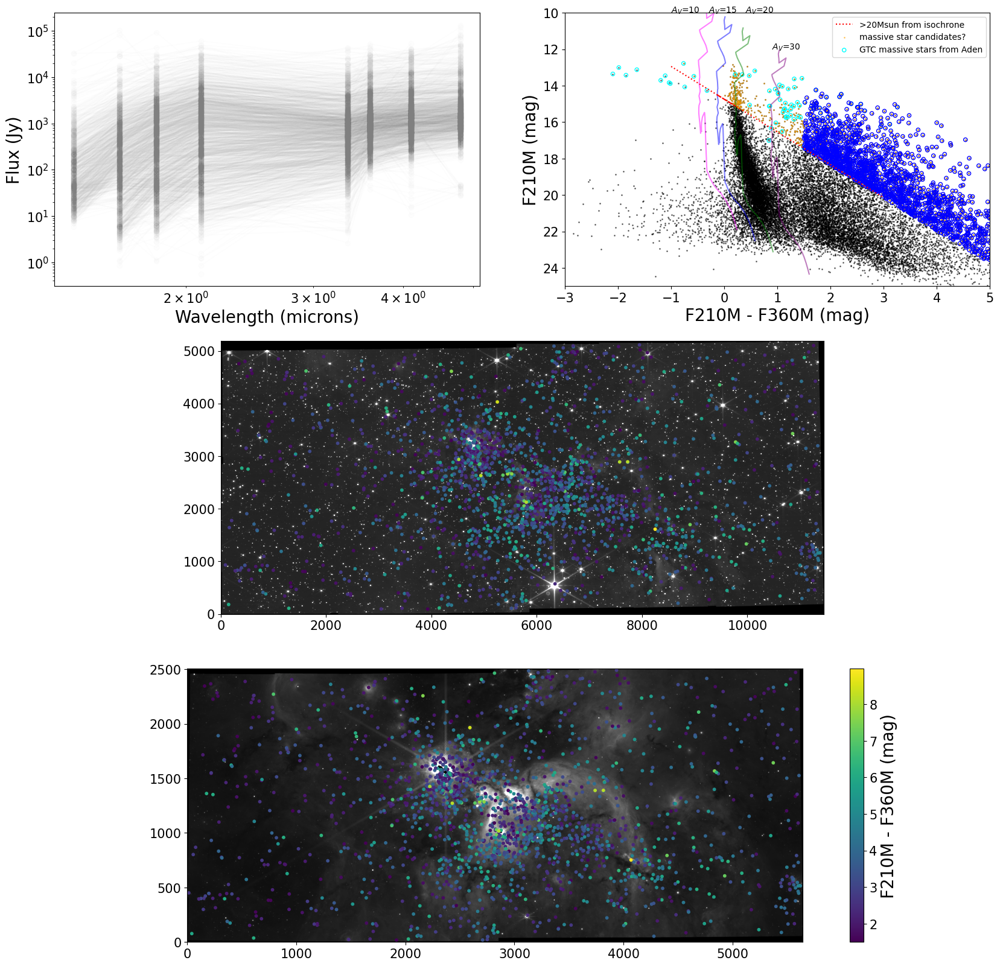

In [40]:
# do the same thing F210M - F360M vs F210M
x = (f210m_mag-f360m_mag).value
y = f210m_mag.value


fig = plt.figure(figsize=(20,20))
gs = gridspec.GridSpec(3, 2, figure=fig)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 = fig.add_subplot(gs[1,:])
ax4 = fig.add_subplot(gs[2,:]) 

hb = ax2.scatter(x, y, s=1, color='k', alpha=0.5)
#cb = fig.colorbar(hb, ax=ax1, label='log(N)')
ax2.set_xlabel('F210M - F360M (mag)')
ax2.set_ylabel('F210M (mag)')
for i, age in enumerate(ageset):
    idx_age = logage_av0 == age
    mass_av0[idx_age].pprint(max_lines=-1)
    ax2.plot((F210M_avmag_av0[idx_age]-F360M_avmag_av0[idx_age]+(ext(1/2.1/u.um)-ext(1/3.6/u.um))*15), (F210M_avmag_av0[idx_age]+(ext(1/2.1/u.um))*15) , color='blue', alpha=0.5)
    ax2.plot((F210M_avmag_av0[idx_age]-F360M_avmag_av0[idx_age]+(ext(1/2.1/u.um)-ext(1/3.6/u.um))*20), (F210M_avmag_av0[idx_age]+(ext(1/2.1/u.um))*20) , color='green', alpha=0.5)
    ax2.plot((F210M_avmag_av0[idx_age]-F360M_avmag_av0[idx_age]+(ext(1/2.1/u.um)-ext(1/3.6/u.um))*10), (F210M_avmag_av0[idx_age]+(ext(1/2.1/u.um))*10) , color='magenta', alpha=0.5)
    ax2.plot((F210M_avmag_av0[idx_age]-F360M_avmag_av0[idx_age]+(ext(1/2.1/u.um)-ext(1/3.6/u.um))*30), (F210M_avmag_av0[idx_age]+(ext(1/2.1/u.um))*30) , color='purple', alpha=0.5)
    idx_10msun = np.argmin(np.abs(mass_av0[idx_age]-20))
    x_av15_10msun = F210M_avmag_av0[idx_age][idx_10msun]-F360M_avmag_av0[idx_age][idx_10msun]+(ext(1/2.1/u.um)-ext(1/3.6/u.um))*15
    y_av15_10msun = F210M_avmag_av0[idx_age][idx_10msun]+(ext(1/2.1/u.um))*15
    x_av20_10msun = F210M_avmag_av0[idx_age][idx_10msun]-F360M_avmag_av0[idx_age][idx_10msun]+(ext(1/2.1/u.um)-ext(1/3.6/u.um))*20
    y_av20_10msun = F210M_avmag_av0[idx_age][idx_10msun]+(ext(1/2.1/u.um))*20
    ax2.plot([x_av15_10msun, x_av20_10msun], [y_av15_10msun, y_av20_10msun], color='r', linestyle='dashed')
    slope = (y_av20_10msun - y_av15_10msun)/(x_av20_10msun - x_av15_10msun)
    y_intercept = y_av15_10msun - slope*x_av15_10msun
    ax2.plot([-1,3], [slope*-1 + y_intercept, slope*3 + y_intercept], color='r', linestyle='dotted',label='>20Msun from isochrone')

spatial_idx2 = np.where((x>1.5)&(y<slope*x + y_intercept))[0]
print(len(spatial_idx2))
for row in catalog[spatial_idx2]:
    plot_SED(ax1,row, filters=['F140M', 'F162M', 'F182M', 'F210M', 'F335M', 'F360M', 'F410M', 'F480M'], color='gray', alpha=0.01)

# plot scatter with differnet color for the point above the line
ax2.scatter(x[y < (slope*x + y_intercept)], y[y < (slope*x + y_intercept)], s=1, color='orange', alpha=0.5, label='massive star candidates?')

ax2.scatter(x[reverse_idx[real_reverse_matched]], y[reverse_idx[real_reverse_matched]], s=20, facecolor='none', edgecolor='cyan', label='GTC massive stars from Aden')
ax2.text(-1,10, r'$A_V$=10')
ax2.text(-0.3,10, r'$A_V$=15')

ax2.text(0.4,10, r'$A_V$=20')
ax2.text(0.9,12, r'$A_V$=30')

ax2.set_xlim(-3,5)
ax2.set_ylim(25, 10)
ax2.legend()
#spatial_idx1 = np.where((x>1.4)&(x<3)&(y<x*slope+y_intercept))[0]
#color mapping of x[spatial_idx1] in the scatter plot
cmap = plt.get_cmap('viridis')
norm = plt.Normalize(vmin=np.min(x[spatial_idx2]), vmax=np.max(x[spatial_idx2]))
ax2.scatter(x[spatial_idx2], y[spatial_idx2], s=20, facecolor='none', edgecolor='b', label='target of interest')

ax3.imshow(f140m_img, origin='lower', cmap='gray', norm=simple_norm(f140m_img, 'sqrt', percent=99.5))
pixelcoord = f140m_wcs.world_to_pixel(catalog['skycoord'])
ax3.scatter(pixelcoord[0][spatial_idx2], pixelcoord[1][spatial_idx2], s=10, c=x[spatial_idx2], norm=norm, facecolor='none')
ax4.imshow(f480m_img, origin='lower', cmap='gray', norm=simple_norm(f480m_img, 'sqrt', percent=99.5))
pixelcoord = f480m_wcs.world_to_pixel(catalog['skycoord'])
scatter = ax4.scatter(pixelcoord[0][spatial_idx2], pixelcoord[1][spatial_idx2], s=10, c=x[spatial_idx2], norm=norm, facecolor='none')
fig.colorbar(scatter, ax=ax4, label='F210M - F360M (mag)')

10141
2263


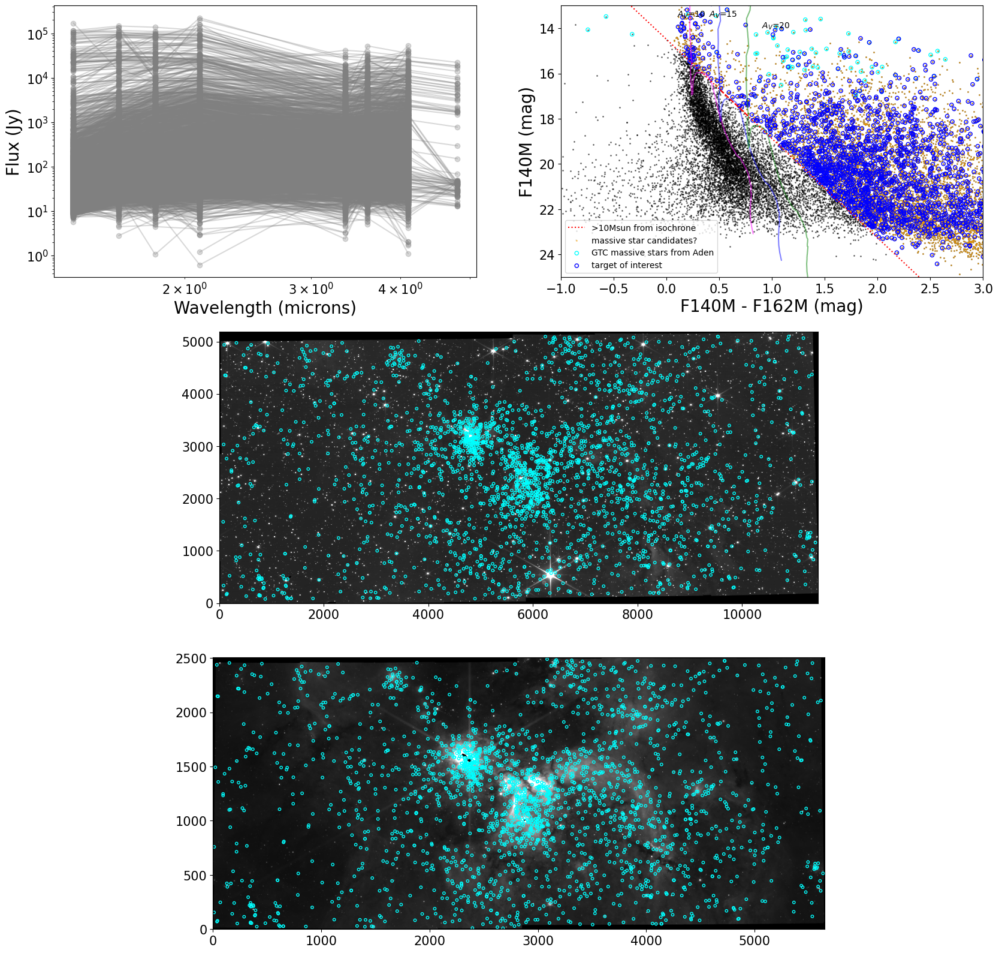

In [41]:
fig = plt.figure(figsize=(20,20))
gs = gridspec.GridSpec(3, 2, figure=fig)
ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1])
ax3 = fig.add_subplot(gs[1,:])
ax4 = fig.add_subplot(gs[2,:]) 


hb = ax2.scatter(x, y, s=1, color='k', alpha=0.5)
#cb = fig.colorbar(hb, ax=ax1, label='log(N)')
ax2.set_xlabel('F140M - F162M (mag)')
ax2.set_ylabel('F140M (mag)')
for i, age in enumerate(ageset):
    idx_age = logage_av0 == age

    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*15) , color='blue', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*20) , color='green', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*10), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*10) , color='magenta', alpha=0.5)
    idx_10msun = np.argmin(np.abs(mass_av0[idx_age]-10))
    x_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15
    y_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*15
    x_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20
    y_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*20
    ax2.plot([x_av15_10msun, x_av20_10msun], [y_av15_10msun, y_av20_10msun], color='r', linestyle='dashed')
    slope = (y_av20_10msun - y_av15_10msun)/(x_av20_10msun - x_av15_10msun)
    y_intercept = y_av15_10msun - slope*x_av15_10msun
    ax2.plot([-1,3], [slope*-1 + y_intercept, slope*3 + y_intercept], color='r', linestyle='dotted',label='>10Msun from isochrone')

# plot scatter with differnet color for the point above the line
n_match = catalog['nmatch_bands']

massive_star_idx = np.where(y < (slope*x + y_intercept))[0]
f360f480 = f360m_mag-f480m_mag
f210f360 = f210m_mag-f360m_mag
df360f480 = np.sqrt(f360m_magerr**2 + f480m_magerr**2)
df210f360 = np.sqrt(f210m_magerr**2 + f360m_magerr**2)
Av=20
E360480 = Av*(ext(1/3.6/u.um)-ext(1/4.8/u.um))
#E210360 = Av*(ext(1/2.1/u.um)-ext(1/3.6/u.um))
spatial_idx1 = np.where((y < (slope*x + y_intercept))&(n_match>2))[0]
yso_idx= np.where(f360f480/df360f480>E360480)[0]
#yso_idx2 = np.where(f210f360/df210f360>E210360)[0]
spatial_idx1 = np.setdiff1d(spatial_idx1, yso_idx)
for row in catalog[spatial_idx1]:
    plot_SED(ax1,row, filters=['F140M', 'F162M', 'F182M', 'F210M', 'F335M', 'F360M', 'F410M', 'F480M'], color='gray', alpha=0.3)
#spatial_idx1 = np.setdiff1d(spatial_idx1, yso_idx2)
#print(len(spatial_idx1), len(massive_star_idx), len(yso_idx), len(yso_idx2))
ax2.scatter(x[y < (slope*x + y_intercept)], y[y < (slope*x + y_intercept)], s=1, color='orange', alpha=0.5, label='massive star candidates?')

ax2.scatter(x[reverse_idx[real_reverse_matched]], y[reverse_idx[real_reverse_matched]], s=20, facecolor='none', edgecolor='cyan', label='GTC massive stars from Aden')
ax2.scatter(x[spatial_idx1], y[spatial_idx1], s=20, facecolor='none', edgecolor='blue', label='target of interest')
print(len(np.where(y < (slope*x + y_intercept))[0]))
ax2.text(0.1,13.5, r'$A_V$=10')
ax2.text(0.4,13.5, r'$A_V$=15')
ax2.text(0.9,14, r'$A_V$=20')
print(len(spatial_idx1))
ax2.set_xlim(-1,3)
ax2.set_ylim(25, 13)
ax2.legend()
ax3.imshow(f140m_img, origin='lower', cmap='gray', norm=simple_norm(f140m_img, 'sqrt', percent=99.5))
pixelcoord = f140m_wcs.world_to_pixel(catalog['skycoord'])
ax3.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')
ax4.imshow(f480m_img, origin='lower', cmap='gray', norm=simple_norm(f480m_img, 'sqrt', percent=99.5))
pixelcoord = f480m_wcs.world_to_pixel(catalog['skycoord'])
ax4.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')

10941
2563
2631


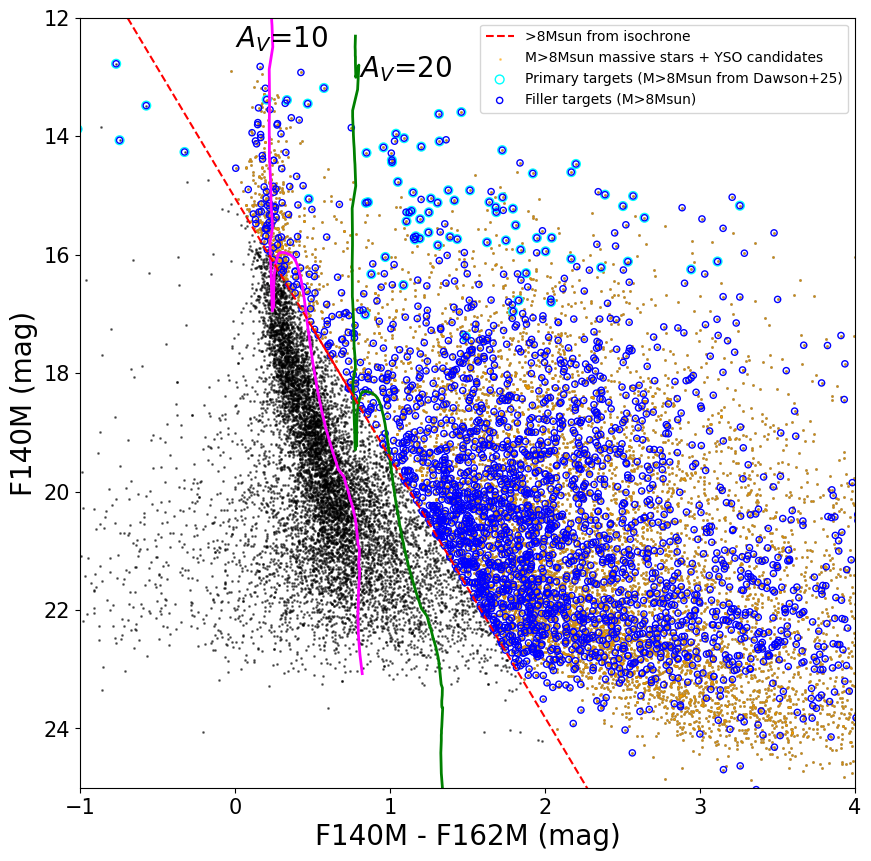

In [42]:
plt.rcParams['axes.labelsize']=20
plt.rcParams['xtick.labelsize']=15
plt.rcParams['ytick.labelsize']=15
fig = plt.figure(figsize=(10,10))
ax2 = fig.add_subplot(111)
hb = ax2.scatter(x, y, s=1, color='k', alpha=0.5)

for i, age in enumerate(ageset):
    idx_age = logage_av0 == age

    #ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*15) , color='blue', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*20) , color='green', lw=2, )
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*10), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*10) , color='magenta', lw=2)
    idx_10msun = np.argmin(np.abs(mass_av0[idx_age]-8))
    x_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15
    y_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*15
    x_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20
    y_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*20
    ax2.plot([x_av15_10msun, x_av20_10msun], [y_av15_10msun, y_av20_10msun], color='r', linestyle='dashed')
    slope = (y_av20_10msun - y_av15_10msun)/(x_av20_10msun - x_av15_10msun)
    y_intercept = y_av15_10msun - slope*x_av15_10msun
    ax2.plot([-1,3], [slope*-1 + y_intercept, slope*3 + y_intercept], color='r', linestyle='dashed',label='>8Msun from isochrone')
n_match = catalog['nmatch_bands']

massive_star_idx = np.where(y < (slope*x + y_intercept))[0]
f360f480 = f360m_mag-f480m_mag
f210f360 = f210m_mag-f360m_mag
df360f480 = np.sqrt(f360m_magerr**2 + f480m_magerr**2)
df210f360 = np.sqrt(f210m_magerr**2 + f360m_magerr**2)
Av=20
E360480 = Av*(ext(1/3.6/u.um)-ext(1/4.8/u.um))
#E210360 = Av*(ext(1/2.1/u.um)-ext(1/3.6/u.um))
spatial_idx1 = np.where((y < (slope*x + y_intercept))&(n_match>2))[0]
yso_idx= np.where(f360f480/df360f480>E360480)[0]
#yso_idx2 = np.where(f210f360/df210f360>E210360)[0]
spatial_idx1 = np.setdiff1d(spatial_idx1, yso_idx)



ax2.scatter(x[y < (slope*x + y_intercept)], y[y < (slope*x + y_intercept)], s=1, color='orange', alpha=0.5, label='M>8Msun massive stars + YSO candidates')

ax2.scatter(x[reverse_idx[real_reverse_matched]], y[reverse_idx[real_reverse_matched]], s=40, facecolor='none', edgecolor='cyan', label='Primary targets (M>8Msun from Dawson+25)')
print(len(np.where(y < (slope*x + y_intercept))[0]))
ax2.text(0,12.5, r'$A_V$=10', fontsize=20)
ax2.text(0.8,13, r'$A_V$=20', fontsize=20)
print(len(spatial_idx1))
ax2.set_xlim(-1,3)
ax2.set_ylim(25, 13)
ax2.set_xlim(-1,4)
ax2.set_ylim(25, 12)
ax2.set_xlabel('F140M - F162M (mag)')
ax2.set_ylabel('F140M (mag)')


merged_catalog = np.unique(np.concatenate((reverse_idx[real_reverse_matched],spatial_idx1)) )
print(len(merged_catalog))

ax2.scatter(x[merged_catalog], y[merged_catalog], s=20, facecolor='none', edgecolor='blue', label='Filler targets (M>8Msun)')
ax2.legend()

plt.savefig('cmd_140_162_20magline_nirspec_targets.png', dpi=300)



In [53]:


tab_primary = Table()
tab_primary['ID'] = np.arange(len(tab_gtc_matched_skycoord_valid.ra))+1
#tab_primary['RA'] = ra[reverse_idx[real_reverse_matched]]
#tab_primary['Dec'] = dec[reverse_idx[real_reverse_matched]]
print(len(tab_primary), len(tab_gtc_matched_skycoord_valid.ra))
tab_primary['RA'] = tab_gtc_matched_skycoord_valid.ra
tab_primary['Dec'] = tab_gtc_matched_skycoord_valid.dec

print(len(ra_gtc), len(reverse_idx[real_reverse_matched]), len(real_reverse_matched), len(reverse_idx))
tab_primary['Magnitude'] = np.zeros(len(tab_gtc_matched_skycoord_valid.ra))
tab_primary['Magnitude_Error'] = np.zeros(len(tab_gtc_matched_skycoord_valid.ra))
tab_primary['Magnitude'][real_reverse_matched] = f140m_mag[reverse_idx[real_reverse_matched]].value
tab_primary['Magnitude_Error'][real_reverse_matched] = f140m_magerr[reverse_idx[real_reverse_matched]].value
tab_primary['priority'] = 0
idx_nan_primary = np.isnan(tab_primary['Magnitude'])
tab_primary['Magnitude'][idx_nan_primary] = 0
tab_primary['Magnitude_Error'][idx_nan_primary] = 0
tab_primary.write('NIRSpecMOSTargets_primary.csv', format='csv', overwrite=True)
print(len(tab_primary))
tab_filler = Table()
tab_filler['ID'] = np.arange(len(spatial_idx1))+1
tab_filler['RA'] = ra[spatial_idx1]
tab_filler['Dec'] = dec[spatial_idx1]
tab_filler['Magnitude'] = f140m_mag[spatial_idx1].value
tab_filler['Magnitude_Error'] = f140m_magerr[spatial_idx1].value
tab_filler['priority'] = 1
tab_filler.write('NIRSpecMOSTargets_filler.csv', format='csv', overwrite=True)
print(len(tab_filler))
from astropy.table import Table, vstack
merged_tab = vstack([tab_primary, tab_filler])
merged_tab['ID'] = np.arange(len(merged_tab))+1
merged_tab.write('NIRSpecMOSTargets.csv', format='csv', overwrite=True)


102 102
218 92 102 102
102
2563


10141
2263


NameError: name 'ax' is not defined

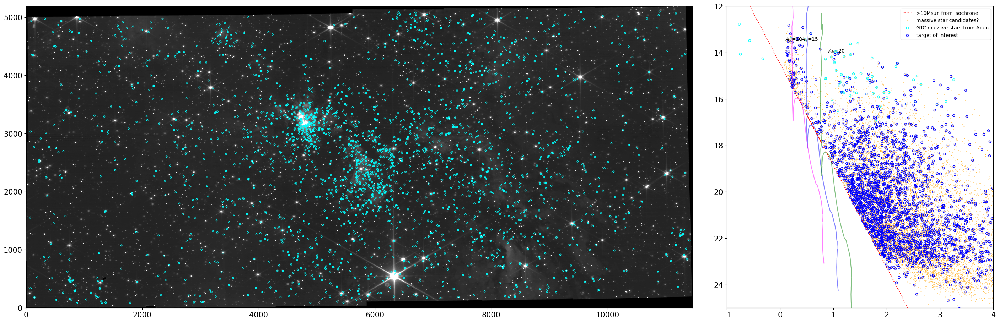

In [ ]:

fig = plt.figure(figsize=(30,10))
ax1 = fig.add_axes([0.03, 0.1, 0.65, 0.85])
ax2 = fig.add_axes([0.7, 0.1, 0.25, 0.85])

for i, age in enumerate(ageset):
    idx_age = logage_av0 == age

    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*15) , color='blue', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*20) , color='green', alpha=0.5)
    ax2.plot((F140M_avmag_av0[idx_age]-F162M_avmag_av0[idx_age]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*10), (F140M_avmag_av0[idx_age]+(ext(1/1.4/u.um))*10) , color='magenta', alpha=0.5)
    idx_10msun = np.argmin(np.abs(mass_av0[idx_age]-10))
    x_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*15
    y_av15_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*15
    x_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]-F162M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um)-ext(1/1.62/u.um))*20
    y_av20_10msun = F140M_avmag_av0[idx_age][idx_10msun]+(ext(1/1.4/u.um))*20
    ax2.plot([x_av15_10msun, x_av20_10msun], [y_av15_10msun, y_av20_10msun], color='r', linestyle='dashed')
    slope = (y_av20_10msun - y_av15_10msun)/(x_av20_10msun - x_av15_10msun)
    y_intercept = y_av15_10msun - slope*x_av15_10msun
    ax2.plot([-1,3], [slope*-1 + y_intercept, slope*3 + y_intercept], color='r', linestyle='dotted',label='>10Msun from isochrone')


n_match = catalog['nmatch_bands']

massive_star_idx = np.where(y < (slope*x + y_intercept))[0]
f360f480 = f360m_mag-f480m_mag
f210f360 = f210m_mag-f360m_mag
df360f480 = np.sqrt(f360m_magerr**2 + f480m_magerr**2)
df210f360 = np.sqrt(f210m_magerr**2 + f360m_magerr**2)
Av=20
E360480 = Av*(ext(1/3.6/u.um)-ext(1/4.8/u.um))
#E210360 = Av*(ext(1/2.1/u.um)-ext(1/3.6/u.um))
spatial_idx1 = np.where((y < (slope*x + y_intercept))&(n_match>2))[0]
yso_idx= np.where(f360f480/df360f480>E360480)[0]
#yso_idx2 = np.where(f210f360/df210f360>E210360)[0]
spatial_idx1 = np.setdiff1d(spatial_idx1, yso_idx)



ax2.scatter(x[y < (slope*x + y_intercept)], y[y < (slope*x + y_intercept)], s=1, color='orange', alpha=0.5, label='massive star candidates?')

ax2.scatter(x[reverse_idx[real_reverse_matched]], y[reverse_idx[real_reverse_matched]], s=20, facecolor='none', edgecolor='cyan', label='GTC massive stars from Aden')
ax2.scatter(x[spatial_idx1], y[spatial_idx1], s=20, facecolor='none', edgecolor='blue', label='target of interest')
print(len(np.where(y < (slope*x + y_intercept))[0]))
ax2.text(0.1,13.5, r'$A_V$=10')
ax2.text(0.4,13.5, r'$A_V$=15')
ax2.text(0.9,14, r'$A_V$=20')
print(len(spatial_idx1))
ax2.set_xlim(-1,3)
ax2.set_ylim(25, 13)
ax2.legend()
ax2.set_xlim(-1,4)
ax2.set_ylim(25, 12)
ax1.imshow(f140m_img, origin='lower', cmap='gray', norm=simple_norm(f140m_img, 'sqrt', percent=99.5))
pixelcoord = f140m_wcs.world_to_pixel(catalog['skycoord'])
ax1.scatter(pixelcoord[0][spatial_idx1], pixelcoord[1][spatial_idx1], s=10, edgecolor='cyan', facecolor='none')
ax